# 2| Import Necessary libs

In [3]:
# Data manipulation
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Feature extraction
from sklearn.feature_extraction.text import TfidfVectorizer

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

# Preprocessing and evaluation
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Saving model/vectorizer
import pickle
import warnings
warnings.filterwarnings('ignore')


# 3| Loading our data

In [4]:
df = pd.read_csv("Phishing_Email.csv")

df.head()

,Unnamed: 0,Email Text,Email Type
0,0,"re : 6 . 1100 , disc : uniformitarianism , re ...",Safe Email
1,1,the other side of * galicismos * * galicismo *...,Safe Email
2,2,re : equistar deal tickets are you still avail...,Safe Email
3,3,\nHello I am your hot lil horny toy.\n I am...,Phishing Email
4,4,software at incredibly low prices ( 86 % lower...,Phishing Email


# 4| Text Preprocessing

In [5]:
df.isnull().sum()

Unnamed: 0     0
Email Text    16
Email Type     0
dtype: int64

** There are 16 rows available that have null values .Let's remove these rows



## 4.1| Drop duplicates and null values

In [6]:
df.drop(["Unnamed: 0"],axis=1,inplace=True)
df.dropna(inplace=True,axis=0)
df.drop_duplicates(inplace=True)

In [7]:
print("Dimension of the row data:",df.shape)

Dimension of the row data: (17538, 2)


In [8]:
df.head()

,Email Text,Email Type
0,"re : 6 . 1100 , disc : uniformitarianism , re ...",Safe Email
1,the other side of * galicismos * * galicismo *...,Safe Email
2,re : equistar deal tickets are you still avail...,Safe Email
3,\nHello I am your hot lil horny toy.\n I am...,Phishing Email
4,software at incredibly low prices ( 86 % lower...,Phishing Email


In [9]:
# Create the bar chart
fig = px.bar(df['Email Type'].value_counts(), x=df['Email Type'].value_counts().index, y=df['Email Type'].value_counts().values,
             color=['blue', 'red'], labels={'x': 'Category', 'y': 'Count'},
             title="Categorical Distribution")

# Show the plot
fig.show()

Insigths :

The count of the safe emails is more than that of phishing email so if we see any emails that look like phishing delete

In [10]:
# Create the pie chart
fig_pie = px.pie(df['Email Type'].value_counts(), names=df['Email Type'].value_counts().index,
                 values=df['Email Type'].value_counts().values, title="Categorical Distribution")

# Show the pie chart
fig_pie.show()

## 4.3| Integer Encoding

In [11]:
le = LabelEncoder()

df["Email Type"] = le.fit_transform(df["Email Type"])

In [12]:
df

,Email Text,Email Type
0,"re : 6 . 1100 , disc : uniformitarianism , re ...",1
1,the other side of * galicismos * * galicismo *...,1
2,re : equistar deal tickets are you still avail...,1
3,\nHello I am your hot lil horny toy.\n I am...,0
4,software at incredibly low prices ( 86 % lower...,0
...,...,...
18644,\nRick Moen a Ã©crit:> > I'm confused. I thou...,1
18645,date a lonely housewife always wanted to date ...,0
18646,request submitted : access request for anita ....,1
18647,"re : important - prc mtg hi dorn & john , as y...",1


## 4.4 Remove hyperlinks, punctuations, extra space

In [13]:
import re

def preprocess_text(text):
    # Remove hyperlinks
    text = re.sub(r'http\S+', '', text)

    # Remove punctuations
    text = re.sub(r'[^\w\s]', '', text)

    # Convert to lowercase
    text = text.lower()

    # Remove extra spaces
    text = re.sub(r'\s+', ' ', text).strip()
    return text


# Apply the preprocess_text function to the specified column in the DataFrame
df["Email Text"] =df["Email Text"].apply(preprocess_text)

In [14]:
df.head()

,Email Text,Email Type
0,re 6 1100 disc uniformitarianism re 1086 sex l...,1
1,the other side of galicismos galicismo is a sp...,1
2,re equistar deal tickets are you still availab...,1
3,hello i am your hot lil horny toy i am the one...,0
4,software at incredibly low prices 86 lower dra...,0


In [15]:
!pip install wordcloud

# WordCloud

## wordcloud of avaiable stopwords

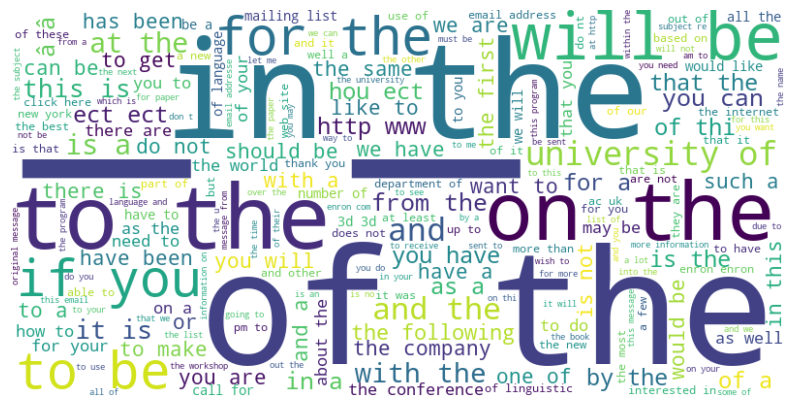

In [16]:
from wordcloud import WordCloud

#combine all rows into a single string
all_mails = " ".join(df['Email Text'])

#create a wordcloud object
word_cloud = WordCloud(stopwords="english",width=800,height=400,background_color='white').generate(all_mails)

plt.figure(figsize=(10,6))
plt.imshow(word_cloud,interpolation='bilinear')
plt.axis("off")
plt.show()

## wordcloude of unique words

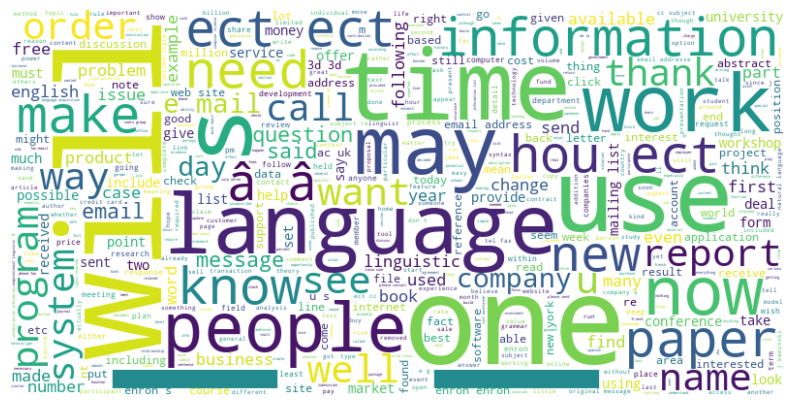

In [17]:
#combine all rows into a single string
all_mails = " ".join(df['Email Text'])

#create a wordcloud object
word_cloud = WordCloud(width=800,height=400,background_color='white',max_words=10000).generate(all_mails)
plt.figure(figsize=(10,6))
plt.imshow(word_cloud,interpolation='bilinear')
plt.axis("off")
plt.show()

## 4.5 Converting text into vector

### 4.5.1 Tfidf vectorizer

In [18]:
tf = TfidfVectorizer(stop_words="english",max_features=10000) #dimension reduction

feature_x = tf.fit_transform(df["Email Text"]).toarray()

In [19]:
y_tf = np.array(df['Email Type']) # convert the label into numpy array

### 4.5.2 Splitting into train and test

In [20]:
x_train,x_test,y_train,y_test = train_test_split(feature_x,y_tf,train_size=0.8,random_state=0)

# 5| Applying different algorithm

## 5.1| Naive Bayes

In [21]:
#naive bayes works with condtional probability
from sklearn.naive_bayes import MultinomialNB
nb = MultinomialNB()
nb.fit(x_train,y_train)

MultinomialNB()

accuracy from native bayes: 97.52 %
f1 score from naive bayes: 97.99 %
classification report :

               precision    recall  f1-score   support

           0       0.97      0.96      0.97      1351
           1       0.98      0.98      0.98      2157

    accuracy                           0.98      3508
   macro avg       0.97      0.97      0.97      3508
weighted avg       0.98      0.98      0.98      3508



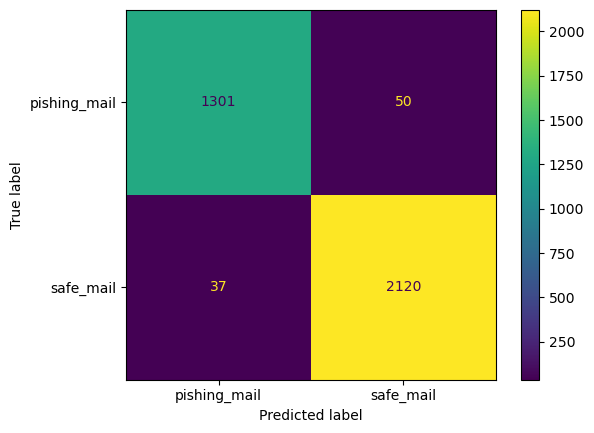

In [22]:
from sklearn.metrics import accuracy_score,f1_score,classification_report,ConfusionMatrixDisplay,confusion_matrix
pred_nav = nb.predict(x_test)

# Checking the performance

print(f"accuracy from native bayes: {accuracy_score(y_test,pred_nav)*100:.2f} %")
print(f"f1 score from naive bayes: {f1_score(y_test,pred_nav)*100:.2f} %")
print("classification report :\n\n",classification_report(y_test,pred_nav))

#confusion matrix
clf_nav = confusion_matrix(y_test,pred_nav)
cx_ = ConfusionMatrixDisplay(clf_nav,display_labels=['pishing_mail','safe_mail']).plot()
plt.show()

## 5.2| Logistic Regression


accuracy from logistic regression:97.95 %
f1 score from logistic regression: 98.34 %
classification report : 
               precision    recall  f1-score   support

           0       0.98      0.96      0.97      1351
           1       0.98      0.99      0.98      2157

    accuracy                           0.98      3508
   macro avg       0.98      0.98      0.98      3508
weighted avg       0.98      0.98      0.98      3508



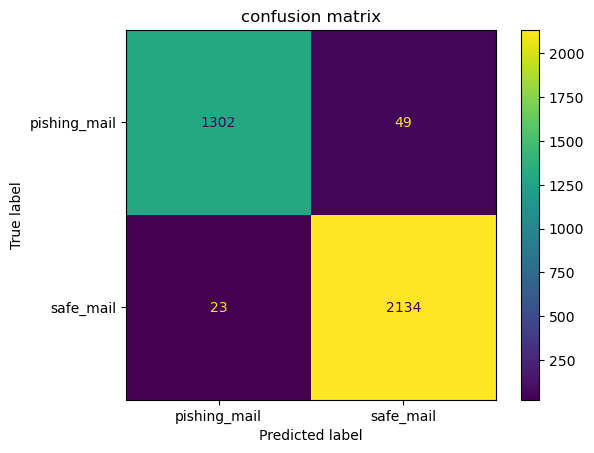

In [23]:
lg = LogisticRegression()
lg.fit(x_train,y_train)

# prediction
pred_lg = lg.predict(x_test)
# performance
print("")
print(f"accuracy from logistic regression:{accuracy_score(y_test,pred_lg)*100:.2f} %")
print(f"f1 score from logistic regression: {f1_score(y_test,pred_lg)*100:.2f} %")
print("classification report : \n",classification_report(y_test,pred_lg))

clf_lg = confusion_matrix(y_test,pred_lg)
cx_ = ConfusionMatrixDisplay(clf_lg,display_labels=['pishing_mail','safe_mail']).plot()
plt.title("confusion matrix")
plt.show()

In [24]:
# save the model for future use

import joblib

# Save the trained model to a file
joblib.dump(nb, 'email_spam_nb.pkl')

['email_spam_nb.pkl']

## 5.3| SGD Classifier

accuracy from logistic regression:98.52 %
f1 score from logistic regression: 98.80 %
classification report : 
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      1351
           1       0.99      0.99      0.99      2157

    accuracy                           0.99      3508
   macro avg       0.98      0.98      0.98      3508
weighted avg       0.99      0.99      0.99      3508



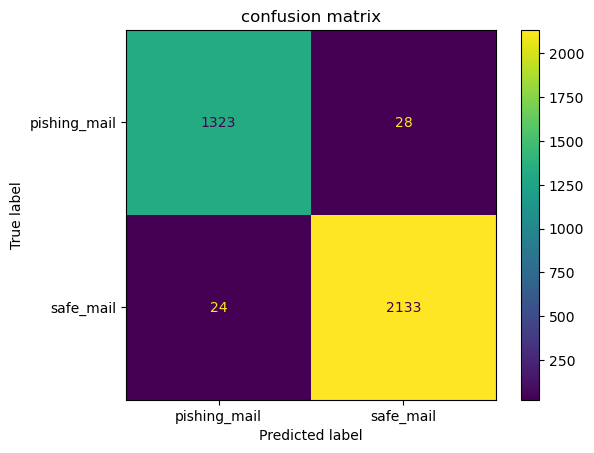

In [25]:
from sklearn.linear_model import SGDClassifier

# passing object
sgd = SGDClassifier()
sgd.fit(x_train,y_train)

# prediction
pred_sgd = sgd.predict(x_test)
# performance
print(f"accuracy from logistic regression:{accuracy_score(y_test,pred_sgd)*100:.2f} %")
print(f"f1 score from logistic regression: {f1_score(y_test,pred_sgd)*100:.2f} %")
print("classification report : \n",classification_report(y_test,pred_sgd))

clf_sgd = confusion_matrix(y_test,pred_sgd)
cx_ = ConfusionMatrixDisplay(clf_sgd,display_labels=['pishing_mail','safe_mail']).plot()
plt.title("confusion matrix")
plt.show()

## 5.5| Decision Tree

accuracy from Decision Tree:92.82 %
f1 score from Decision Tree: 94.11 %
classification report : 
               precision    recall  f1-score   support

           0       0.90      0.92      0.91      1351
           1       0.95      0.93      0.94      2157

    accuracy                           0.93      3508
   macro avg       0.92      0.93      0.92      3508
weighted avg       0.93      0.93      0.93      3508



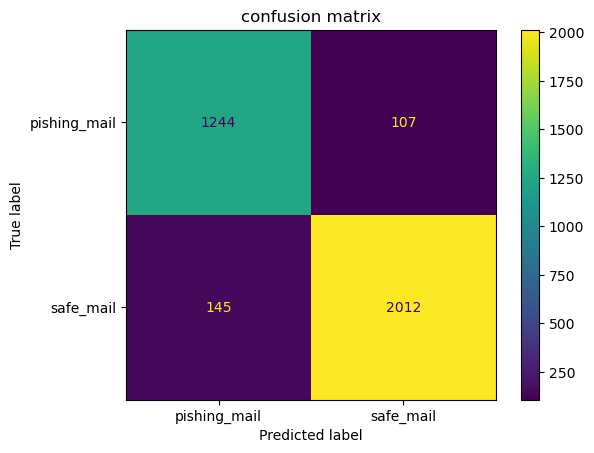

In [26]:
dtr = DecisionTreeClassifier() #passing object
dtr.fit(x_train,y_train)

#prediction
pred_dtr = dtr.predict(x_test)

#performance
print(f"accuracy from Decision Tree:{accuracy_score(y_test,pred_dtr)*100:.2f} %")
print(f"f1 score from Decision Tree: {f1_score(y_test,pred_dtr)*100:.2f} %")
print("classification report : \n",classification_report(y_test,pred_dtr))

#confusion matrix
clf_dtr = confusion_matrix(y_test,pred_dtr)
cx_ = ConfusionMatrixDisplay(clf_dtr,display_labels=['pishing_mail','safe_mail']).plot()
plt.title("confusion matrix")
plt.show()

## 5.6| Random Forest 

accuracy from rnadom forest:97.61 %
f1 score from random forest: 98.05 %
classification report : 
               precision    recall  f1-score   support

           0       0.96      0.97      0.97      1351
           1       0.98      0.98      0.98      2157

    accuracy                           0.98      3508
   macro avg       0.97      0.98      0.97      3508
weighted avg       0.98      0.98      0.98      3508



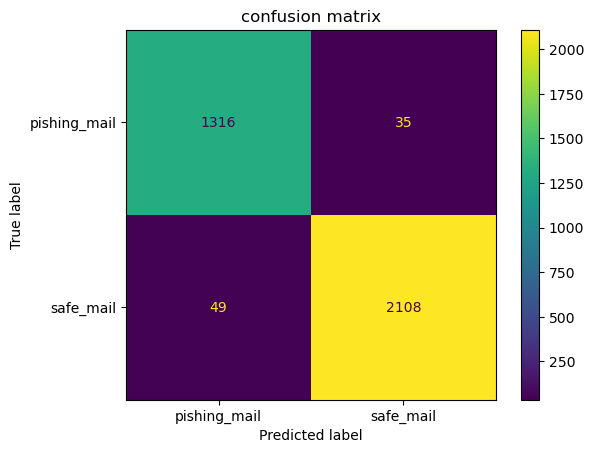

In [27]:
rnf = RandomForestClassifier() #passing object
rnf.fit(x_train,y_train)

#prediction
pred_rnf = rnf.predict(x_test)

#performance
print(f"accuracy from rnadom forest:{accuracy_score(y_test,pred_rnf)*100:.2f} %")
print(f"f1 score from random forest: {f1_score(y_test,pred_rnf)*100:.2f} %")
print("classification report : \n",classification_report(y_test,pred_rnf))

#confusion matrix
clf_rnf = confusion_matrix(y_test,pred_rnf)
cx_ = ConfusionMatrixDisplay(clf_rnf,display_labels=['pishing_mail','safe_mail']).plot()
plt.title("confusion matrix")
plt.show()

## 5.8| EDA comparison of the models performances

In [28]:
models = ['Naive bayes', 'Logistic Regression', 'SGD Classifier', 'Decision Tree', 'Random Forest']
accuracies = [97.52, 97.95, 98.57,93.67, 97.72]

# Create the bar chart
fig = px.bar(x=models, y=accuracies, labels={'x': 'Models', 'y': 'Accuracy'},
             title="Performance of the models", text=accuracies)

# Customize the layout (optional)
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside', marker_color='magenta')

# Show the plot
fig.show()

In [29]:
import pickle

# Save the vectorizer and model together
with open("phishing_model.pkl", "wb") as f:
    pickle.dump((tf,lg), f)


In [30]:
import pickle
import numpy as np
import re
from nltk.corpus import stopwords
from urllib.parse import urlparse

# Load vectorizer and model
with open('phishing_model.pkl', 'rb') as f:
    tf, model = pickle.load(f)

# Initialize stopwords
stop_words = set(stopwords.words('english'))

# Sample email content for testing
email_text = """Dear user,

Urgent! Your account has been compromised. Please click the link below to reset your password.

https://suspicious-website.com/reset

Best regards,
The Support Team"""

# Transform input
X_input = tf.transform([email_text])

# Predict
if hasattr(model, "predict_proba"):
    proba = model.predict_proba(X_input)[0]
    confidence = np.max(proba)
    prediction = np.argmax(proba)
else:
    prediction = model.predict(X_input)[0]
    confidence = 1.0

# Print the prediction and confidence
result = "✅ Legitimate Email" if prediction == 1 else "🛑 Phishing Email"
print(f"Result: {result}")
print(f"Confidence: {confidence * 100:.2f}%")


Result: 🛑 Phishing Email
Confidence: 94.81%


In [31]:
if hasattr(model, 'coef_'):
    coefficients = model.coef_[0]
    features = tf.get_feature_names_out()
    top_features = sorted(zip(features, coefficients), key=lambda x: abs(x[1]), reverse=True)[:10]
    for word, score in top_features:
        print(f"Feature: {word}, Coefficient: {score}")


Feature: enron, Coefficient: 7.239816334473895
Feature: click, Coefficient: -5.5165078391016245
Feature: url, Coefficient: 5.3699575756026325
Feature: wrote, Coefficient: 4.763701661449412
Feature: http, Coefficient: -4.426686329107702
Feature: language, Coefficient: 4.187016236391593
Feature: date, Coefficient: 4.114241656451286
Feature: thanks, Coefficient: 3.965186535980499
Feature: remove, Coefficient: -3.778605833021036
Feature: university, Coefficient: 3.755174814188879


In [34]:
email_samples = [
    """Dear user, your account is compromised! Click here: https://phishing-link.com""",
    """Hello, your Amazon order has been shipped. Track it here: https://legitimate-link.com""",
    """Attention: Your payment is due immediately. Pay now: https://phishing-payment.com"""
]

for email_text in email_samples:
    X_input = tf.transform([email_text])
    proba = model.predict_proba(X_input)[0]
    confidence = np.max(proba)
    prediction = np.argmax(proba)
    result = "🛑 Phishing Email" if prediction == 0 else "✅ Legitimate Email"
    print(f"Email: {email_text}\nResult: {result} | Confidence: {confidence * 100:.2f}%\n")


Email: Dear user, your account is compromised! Click here: https://phishing-link.com
Result: 🛑 Phishing Email | Confidence: 97.49%

Email: Hello, your Amazon order has been shipped. Track it here: https://legitimate-link.com
Result: 🛑 Phishing Email | Confidence: 78.95%

Email: Attention: Your payment is due immediately. Pay now: https://phishing-payment.com
Result: 🛑 Phishing Email | Confidence: 74.95%



In [35]:
# Example email
email_text = """Dear user,

Urgent! Your account has been compromised. Please click the link below to reset your password.

https://suspicious-website.com/reset

Best regards,
The Support Team"""

# Transform input
X_input = tf.transform([email_text])

# Get prediction probabilities and the prediction
proba = model.predict_proba(X_input)[0]
confidence = np.max(proba)
prediction = np.argmax(proba)

print(f"Prediction: {prediction} (1 = Legitimate, 0 = Phishing)")
print(f"Confidence: {confidence * 100:.2f}%")
print(f"Prediction Probabilities: {proba}")

# Feature importance analysis (if available)
if hasattr(model, 'coef_'):
    coefficients = model.coef_[0]
    features = tf.get_feature_names_out()
    top_features = sorted(zip(features, coefficients), key=lambda x: abs(x[1]), reverse=True)[:10]
    for word, score in top_features:
        print(f"Feature: {word}, Coefficient: {score}")


Prediction: 0 (1 = Legitimate, 0 = Phishing)
Confidence: 94.81%
Prediction Probabilities: [0.94809182 0.05190818]
Feature: enron, Coefficient: 7.239816334473895
Feature: click, Coefficient: -5.5165078391016245
Feature: url, Coefficient: 5.3699575756026325
Feature: wrote, Coefficient: 4.763701661449412
Feature: http, Coefficient: -4.426686329107702
Feature: language, Coefficient: 4.187016236391593
Feature: date, Coefficient: 4.114241656451286
Feature: thanks, Coefficient: 3.965186535980499
Feature: remove, Coefficient: -3.778605833021036
Feature: university, Coefficient: 3.755174814188879


In [41]:
# Example email
email_text = """Solvix Innovations EDu
Hi ,
Thank you for reaching out to Solvix Innovations EDu– we’re excited to connect with you!

We offer a wide range of high-quality final year project topics, complete source codes, and guided tutorship tailored to your academic and professional needs.

To get started, please follow these simple steps:

Browse through our available project courses and packages to choose the one that best fits your interest and academic goals.

Make a payment based on your selected plan.

Send us proof of payment (e.g., a screenshot or receipt) to gain access to:

Full project documentation

Source code and implementation files

Personalized support and tutorship sessions

If you need help choosing the right course or have any questions, feel free to reply to this email or contact our support team at Shakefire@protonmail.com. We're here to guide you every step of the way!

Best regards,
The Solvix Innovations EDuTeam

"""

# Transform input
X_input = tf.transform([email_text])

# Get prediction probabilities and the prediction
proba = model.predict_proba(X_input)[0]
confidence = np.max(proba)
prediction = np.argmax(proba)

print(f"Prediction: {prediction} (1 = Legitimate, 0 = Phishing)")
print(f"Confidence: {confidence * 100:.2f}%")
print(f"Prediction Probabilities: {proba}")

# Feature importance analysis (if available)
if hasattr(model, 'coef_'):
    coefficients = model.coef_[0]
    features = tf.get_feature_names_out()
    top_features = sorted(zip(features, coefficients), key=lambda x: abs(x[1]), reverse=True)[:10]
    for word, score in top_features:
        print(f"Feature: {word}, Coefficient: {score}")


Prediction: 1 (1 = Legitimate, 0 = Phishing)
Confidence: 50.18%
Prediction Probabilities: [0.49818359 0.50181641]
Feature: enron, Coefficient: 7.239816334473895
Feature: click, Coefficient: -5.5165078391016245
Feature: url, Coefficient: 5.3699575756026325
Feature: wrote, Coefficient: 4.763701661449412
Feature: http, Coefficient: -4.426686329107702
Feature: language, Coefficient: 4.187016236391593
Feature: date, Coefficient: 4.114241656451286
Feature: thanks, Coefficient: 3.965186535980499
Feature: remove, Coefficient: -3.778605833021036
Feature: university, Coefficient: 3.755174814188879
